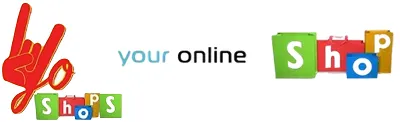

In [1]:
from PIL import Image

Image.open('yoshop.webp')

Task-3:Fake buyer Identification System:
EDA Report Generate below input value(1 to 5)using Test Data file(Yoshops.com Sale Order file) :
Input value for generate PDF and CSV file:
1.The shipping address differs from the billing address.
2.Multiple orders of the same item.
3.Unusually large orders.
4.Multiple orders to the same address with different payment method.
5.Unexpected international orders.

Importing libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib_inline
import matplotlib
import plotly as py
import cufflinks as cf

In [3]:
sns.set_style('whitegrid')
matplotlib.rcParams['font.size']=14
matplotlib.rcParams['figure.figsize'] = (10,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'



In [4]:
data =pd.read_csv('Yoshops.com.csv')
data

,Order #,Order Date and Time Stamp,Fulfillment Status,Payment Status,Payment Date and Time Stamp,Fulfillment Date and Time Stamp,Currency,Subtotal,Shipping Method,Shipping Cost,...,Payment Method,Tracking #,Special Instructions,LineItem Name,LineItem SKU,LineItem Options,LineItem Add-ons,LineItem Qty,LineItem Sale Price,LineItem Type
0,R929392577,09-11-2020 20:36:26 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,799.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN,NaN,1,799.0,physical
1,R653462960,09-11-2020 20:18:26 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,699.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Samsung U Flex Wireless Bluetooth Flexible Hea...,PL000032123,NaN,NaN,1,699.0,physical
2,R226302759,09-11-2020 19:56:21 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,799.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN,NaN,1,799.0,physical
3,R390235057,09-11-2020 19:37:40 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,599.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,JBL Tempo On-Ear Headphone,PL000157,NaN,NaN,1,599.0,physical
4,R813855117,09-11-2020 18:35:47 +0530,Cancelled,Paid,NaN,NaN,INR,699.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Mi Neckband Bluetooth Headset with Mic (Black),PL000041332,NaN,NaN,1,699.0,physical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2292,R243395005,05-10-2016 04:17:45 +0530,Cancelled,Unpaid,NaN,NaN,INR,50.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Ear Wired Earphones With Mic White,11,NaN,NaN,1,50.0,physical
2293,R607209508,03-10-2016 15:10:47 +0530,Cancelled,Unpaid,NaN,NaN,INR,500.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,I Kall K-66 White,9,NaN,NaN,1,500.0,physical
2294,R140316623,29-09-2016 18:33:27 +0530,Cancelled,Unpaid,NaN,NaN,INR,4000.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Electric Steam Cooker Maestro MC1,1,NaN,NaN,2,2000.0,physical
2295,R192037084,28-09-2016 18:59:22 +0530,Cancelled,Unpaid,NaN,NaN,INR,2000.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Electric Steam Cooker Maestro MC1,1,NaN,NaN,1,2000.0,physical


In [5]:
data.head(5)

,Order #,Order Date and Time Stamp,Fulfillment Status,Payment Status,Payment Date and Time Stamp,Fulfillment Date and Time Stamp,Currency,Subtotal,Shipping Method,Shipping Cost,...,Payment Method,Tracking #,Special Instructions,LineItem Name,LineItem SKU,LineItem Options,LineItem Add-ons,LineItem Qty,LineItem Sale Price,LineItem Type
0,R929392577,09-11-2020 20:36:26 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,799.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN,NaN,1,799.0,physical
1,R653462960,09-11-2020 20:18:26 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,699.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Samsung U Flex Wireless Bluetooth Flexible Hea...,PL000032123,NaN,NaN,1,699.0,physical
2,R226302759,09-11-2020 19:56:21 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,799.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN,NaN,1,799.0,physical
3,R390235057,09-11-2020 19:37:40 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,599.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,JBL Tempo On-Ear Headphone,PL000157,NaN,NaN,1,599.0,physical
4,R813855117,09-11-2020 18:35:47 +0530,Cancelled,Paid,NaN,NaN,INR,699.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Mi Neckband Bluetooth Headset with Mic (Black),PL000041332,NaN,NaN,1,699.0,physical


In [6]:
data.shape

(2297, 41)

In [7]:
data.columns

Index(['Order #', 'Order Date and Time Stamp', 'Fulfillment Status',
       'Payment Status', 'Payment Date and Time Stamp',
       'Fulfillment Date and Time Stamp', 'Currency', 'Subtotal',
       'Shipping Method', 'Shipping Cost', 'Tax Method', 'Taxes', 'Total',
       'Coupon Code', 'Coupon Code Name', 'Discount', 'Billing Name',
       'Billing Country', 'Billing Street Address', 'Billing Street Address 2',
       'Billing City', 'Billing State', 'Billing Zip', 'Shipping Name',
       'Shipping Country', 'Shipping Street Address',
       'Shipping Street Address 2', 'Shipping City', 'Shipping State',
       'Shipping Zip', 'Gift Cards', 'Payment Method', 'Tracking #',
       'Special Instructions', 'LineItem Name', 'LineItem SKU',
       'LineItem Options', 'LineItem Add-ons', 'LineItem Qty',
       'LineItem Sale Price', 'LineItem Type'],
      dtype='object')

In [8]:
data.info

<bound method DataFrame.info of          Order #  Order Date and Time Stamp Fulfillment Status Payment Status  \
0     R929392577  09-11-2020 20:36:26 +0530        Unfulfilled         Unpaid   
1     R653462960  09-11-2020 20:18:26 +0530        Unfulfilled         Unpaid   
2     R226302759  09-11-2020 19:56:21 +0530        Unfulfilled         Unpaid   
3     R390235057  09-11-2020 19:37:40 +0530        Unfulfilled         Unpaid   
4     R813855117  09-11-2020 18:35:47 +0530          Cancelled           Paid   
...          ...                        ...                ...            ...   
2292  R243395005  05-10-2016 04:17:45 +0530          Cancelled         Unpaid   
2293  R607209508  03-10-2016 15:10:47 +0530          Cancelled         Unpaid   
2294  R140316623  29-09-2016 18:33:27 +0530          Cancelled         Unpaid   
2295  R192037084  28-09-2016 18:59:22 +0530          Cancelled         Unpaid   
2296  R414254148  28-09-2016 15:37:32 +0530          Fulfilled           Paid

In [9]:
data[['Shipping Street Address','Shipping Street Address 2','Billing Street Address','Billing Street Address 2']]

,Shipping Street Address,Shipping Street Address 2,Billing Street Address,Billing Street Address 2
0,"Sec-86 nawada fatehpur, postoffice-Sikanderpur...",NaN,NaN,NaN
1,Nashik,Nashik,NaN,NaN
2,Madhuranagar 2nd stage hostel,Rbw apartment,NaN,NaN
3,Civil line near lic office,NaN,NaN,NaN
4,Nps thakur sthan Rajgir,NaN,NaN,NaN
...,...,...,...,...
2292,Gcc,Ggggh,Gcc,Ggggh
2293,"Mayuree bihar,1st lane,near somnathnagar","Mayuree Bihar 1st line,near mayurapartment,po/...","Mayuree bihar,1st lane,near somnathnagar","Mayuree Bihar 1st line,near mayurapartment,po/..."
2294,mayuree vihar 1st lane,NaN,mayuree vihar 1st lane,NaN
2295,test,gast,test,gast


Diffrent billing and shipping address

In [10]:
data1 = data.dropna(subset=['Billing Street Address','Shipping Street Address','Billing Street Address 2','Shipping Street Address 2'])

In [11]:
data1.loc[data1['Billing Street Address'] != data1['Shipping Street Address'], 'Condition'] = 'No'

In [12]:
data1.loc[data1['Billing Street Address'] == data1['Shipping Street Address'], 'Condition'] = 'Yes'


In [13]:
data1[['Order #','LineItem Name']]

,Order #,LineItem Name
86,R898688791,HX-713 Remote Control Helicopter
101,R360291190,Samsung Level U Bluetooth Wireless in-Ear Head...
135,R903446137,Boat Rockerz 530 Bluetooth Headphone with Mic ...
144,R072716574,Realme R-260 WIRE LES HEADPHONES
164,R126827740,1KG Chicken Biryani (Chennai)
...,...,...
2273,R968858875,iBall Excelance CompBook 11.6-inch Laptop
2292,R243395005,Ear Wired Earphones With Mic White
2293,R607209508,I Kall K-66 White
2295,R192037084,Electric Steam Cooker Maestro MC1


In [14]:
a = data1.groupby('LineItem Name').count().sort_values('Order #', ascending=False).reset_index()
a

,LineItem Name,Order #,Order Date and Time Stamp,Fulfillment Status,Payment Status,Payment Date and Time Stamp,Fulfillment Date and Time Stamp,Currency,Subtotal,Shipping Method,...,Payment Method,Tracking #,Special Instructions,LineItem SKU,LineItem Options,LineItem Add-ons,LineItem Qty,LineItem Sale Price,LineItem Type,Condition
0,"BOSE Sound True SQ2 Headphones (White,Black,Red)",16,16,16,16,4,4,16,16,16,...,4,0,0,16,0,15,16,16,16,16
1,JBL EARPHONE POUCH BLACK,13,13,13,13,4,4,13,13,13,...,4,2,0,13,0,0,13,13,13,13
2,"JBL C100SI Wired Headphones (Black,Red,White)",10,10,10,10,3,3,10,10,10,...,3,2,0,10,0,10,10,10,10,10
3,Boat Rockerz 255 Wireless Bluetooth Headset wi...,8,8,8,8,0,0,8,8,8,...,0,0,0,8,0,0,8,8,8,8
4,Reliance Jio Phone,8,8,8,8,3,0,8,8,8,...,3,0,0,8,0,0,8,8,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,HX708 Remote Control Helicopter,1,1,1,1,0,0,1,1,1,...,0,0,0,1,0,0,1,1,1,1
88,HX 750 Remote Control Flying Drone No Camera,1,1,1,1,1,1,1,1,1,...,1,1,0,1,1,0,1,1,1,1
89,Flying Helicopter With Remote Control,1,1,1,1,0,0,1,1,1,...,0,0,0,1,1,0,1,1,1,1
90,Drone Quadcopter 2.4G 6-Channel Without Camera,1,1,1,1,1,1,1,1,1,...,1,0,0,1,0,0,1,1,1,1


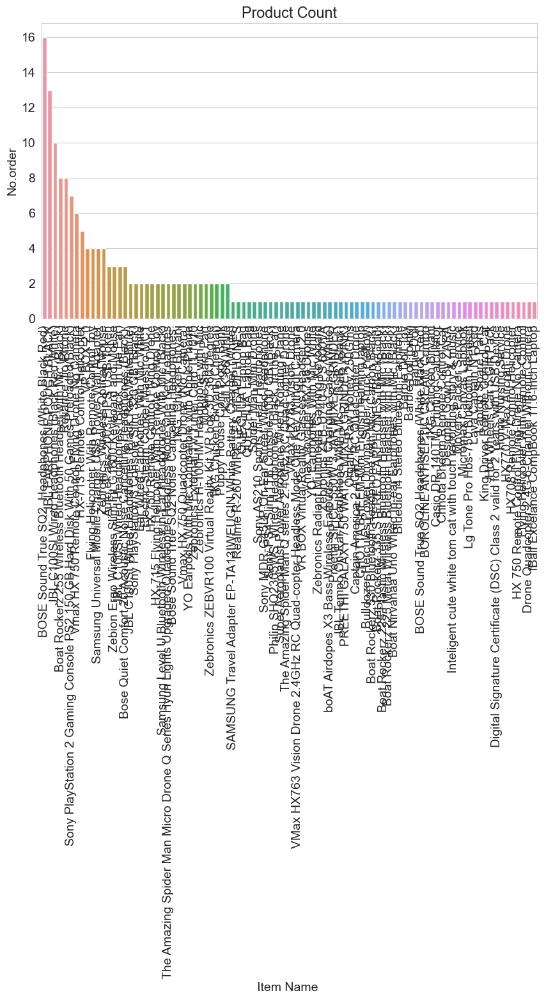

In [15]:
plt.gcf()
sns.barplot(data = a, x='LineItem Name', y = 'Order #' )
plt.xlabel('Item Name ')
plt.ylabel('No.order')
plt.title('Product Count')
plt.xticks(rotation = 90)
matplotlib.rcParams['figure.figsize'] = (10,7)
plt.show()


Multiple Order of Same Item

In [16]:
b = data.groupby('LineItem Name').count().head(10).sort_values('Order #', ascending=False).reset_index()
b

,LineItem Name,Order #,Order Date and Time Stamp,Fulfillment Status,Payment Status,Payment Date and Time Stamp,Fulfillment Date and Time Stamp,Currency,Subtotal,Shipping Method,...,Gift Cards,Payment Method,Tracking #,Special Instructions,LineItem SKU,LineItem Options,LineItem Add-ons,LineItem Qty,LineItem Sale Price,LineItem Type
0,1KG Chicken Biryani (Chennai),33,33,33,33,1,0,33,33,33,...,0,1,0,0,33,0,0,33,33,33
1,Auto ePass 2003 FIPS USB Token,6,6,6,6,2,2,6,6,6,...,0,2,0,0,6,0,0,6,6,6
2,Zebronics Wireless Optical Mouse,5,5,5,5,0,0,5,5,5,...,0,0,0,0,5,0,0,5,5,5
3,1 Bucket Chicken Biryani Party Pack 5kg (Chennai),5,5,5,5,0,0,5,5,5,...,0,0,0,0,5,0,0,5,5,5
4,1KG Chicken Biryani,4,4,4,4,1,0,4,4,4,...,0,1,0,0,4,0,0,4,4,4
5,1KG Chicken Biryani,2,2,2,2,0,0,2,2,2,...,0,0,0,0,2,0,0,2,2,2
6,3 Wheeled Scooter For Kids,2,2,2,2,0,0,2,2,2,...,0,0,0,0,2,0,0,2,2,2
7,AmbranePowerBank P-1310,2,2,2,2,0,0,2,2,2,...,0,0,0,0,2,0,0,2,2,2
8,BOROLINE ANTISEPTIC CREAM Combo,2,2,2,2,0,0,2,2,2,...,0,0,0,0,2,0,0,2,2,2
9,"AmbranePowerBank P-1111(white,Blue)",1,1,1,1,0,0,1,1,1,...,0,0,0,0,1,0,0,1,1,1


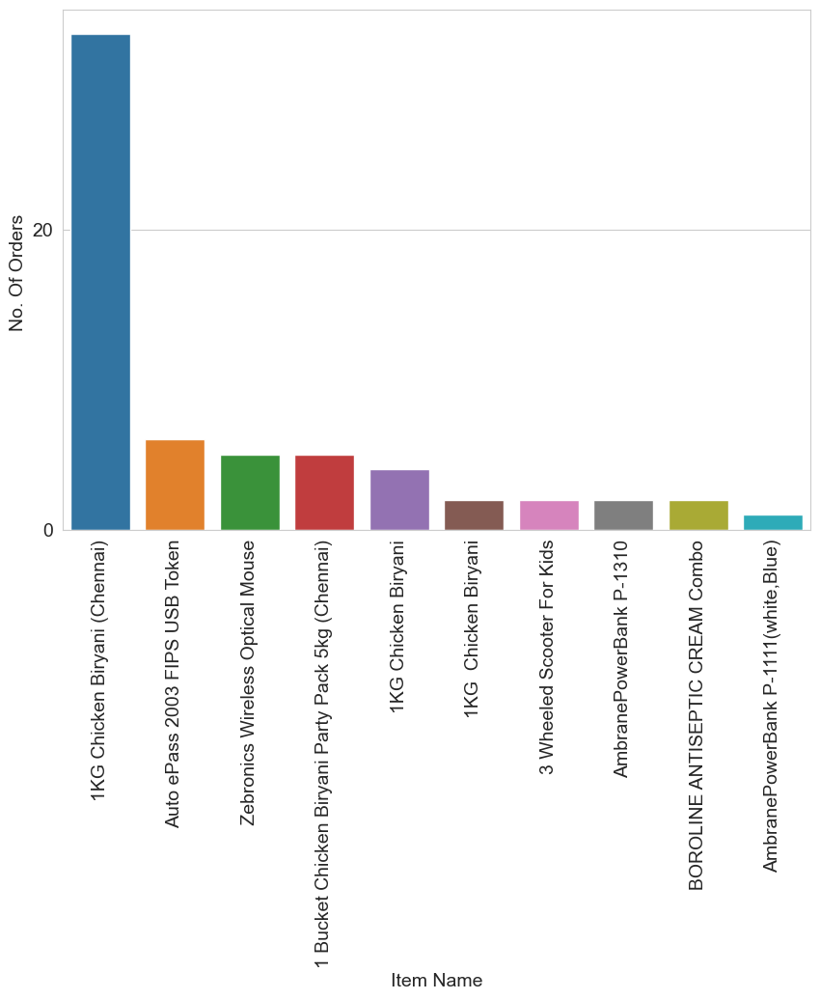

In [17]:
plt.gcf()
sns.barplot(data=b, x='LineItem Name', y='Order #')
plt.xlabel('Item Name')
plt.ylabel('No. Of Orders ')
plt.xticks(rotation = 90)
matplotlib.rcParams['figure.figsize']=(20,15)
matplotlib.rcParams['font.size']=50
matplotlib.rcParams['font.style'] = 'normal'
plt.show()

Unusuallly Large Order

In [18]:
df = data[['Order #','LineItem Name','LineItem Sale Price']]


In [19]:
df

,Order #,LineItem Name,LineItem Sale Price
0,R929392577,Boat Rockerz 530 Bluetooth Headphone with Mic ...,799.0
1,R653462960,Samsung U Flex Wireless Bluetooth Flexible Hea...,699.0
2,R226302759,Boat Rockerz 530 Bluetooth Headphone with Mic ...,799.0
3,R390235057,JBL Tempo On-Ear Headphone,599.0
4,R813855117,Mi Neckband Bluetooth Headset with Mic (Black),699.0
...,...,...,...
2292,R243395005,Ear Wired Earphones With Mic White,50.0
2293,R607209508,I Kall K-66 White,500.0
2294,R140316623,Electric Steam Cooker Maestro MC1,2000.0
2295,R192037084,Electric Steam Cooker Maestro MC1,2000.0


In [20]:
df['LineItem Sale Price'].dtypes

dtype('float64')

In [21]:
df_new = df[df['LineItem Sale Price'] > 10000.0]
df_new

,Order #,LineItem Name,LineItem Sale Price
687,R234378732,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
737,R229759444,SONY PlayStation PS4 PRO 1TB Hard Disk(Black),31999.0
753,R223605910,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
762,R581317479,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
819,R726066091,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
833,R519454135,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
908,R592557574,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
910,R238131793,Sony PlayStation PS3 Console Slim 320 GB (Black),14999.0
948,R810653306,SONY PlayStation PS4 PRO 1TB Hard Disk(Black),31999.0
955,R618718860,Sony PlayStation 3 Console Slim 320 GB (Black),14999.0


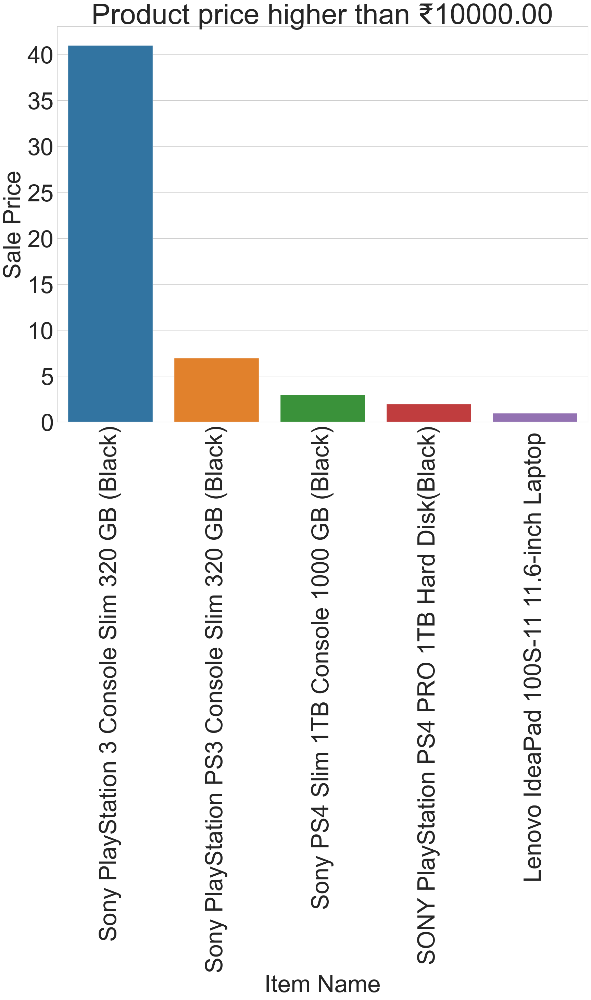

In [22]:
c= df_new.groupby('LineItem Name').count().sort_values('Order #', ascending=False).reset_index()
plt.gcf()
sns.barplot(data=c, x='LineItem Name', y='LineItem Sale Price')
plt.xlabel('Item Name')
plt.ylabel('Sale Price')
plt.title('Product price higher than ₹10000.00')
plt.xticks(rotation = 90)
matplotlib.rcParams['figure.figsize'] = (20,15)
matplotlib.rcParams['font.size']=25
plt.show()

Order with same address and diffrent payment method

In [44]:
df2 = data[['Billing Street Address', 'Shipping Street Address', 'Order #', 'LineItem Name', 'Payment Method']]

j=df2['Billing Street Address'].value_counts()
j

test                                                                    10
34/70, V S Madulai Street Saidapet, Chennai, Tamil Nadu, PIN -600114     6
40,WESTPONNAKARAM 3RD STREET                                             5
H# 10-7-732/b, Opp:HP bidi factory                                       4
wdddddddd                                                                4
                                                                        ..
22251'gali no 2,durga colony taruwala                                    1
A 10 gandhi colony pawanpuri                                             1
10                                                                       1
A695A, Near Shiv Mandir                                                  1
mayuree vihar 1st lane                                                   1
Name: Billing Street Address, Length: 283, dtype: int64

In [45]:
k=df2['Shipping Street Address'].value_counts()
k

Kaushalya Bhavan, B37165-12                          25
Kaushalya Bhavan, B37/165-12                         14
test                                                  9
rajapara khodiyar hanumanji mandir                    7
Bageshwari gumti bindu gali ,po-r.s.gaya,ps-delha     7
                                                     ..
lashkari Bagh raju kirana store Nagpur                1
Somnaha puskar bank samastipur                        1
Nihal Vihar, Nihal Vihar, Lakshmi Park                1
Po box ,4040                                          1
mayuree vihar 1st lane                                1
Name: Shipping Street Address, Length: 2015, dtype: int64

In [26]:
df2[(df2['Billing Street Address'] == df2['Shipping Street Address'])]
df2[['Order #','LineItem Name','Payment Method','Billing Street Address']]

,Order #,LineItem Name,Payment Method,Billing Street Address
0,R929392577,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN
1,R653462960,Samsung U Flex Wireless Bluetooth Flexible Hea...,NaN,NaN
2,R226302759,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN
3,R390235057,JBL Tempo On-Ear Headphone,NaN,NaN
4,R813855117,Mi Neckband Bluetooth Headset with Mic (Black),NaN,NaN
...,...,...,...,...
2292,R243395005,Ear Wired Earphones With Mic White,NaN,Gcc
2293,R607209508,I Kall K-66 White,NaN,"Mayuree bihar,1st lane,near somnathnagar"
2294,R140316623,Electric Steam Cooker Maestro MC1,NaN,mayuree vihar 1st lane
2295,R192037084,Electric Steam Cooker Maestro MC1,NaN,test


<AxesSubplot:ylabel='LineItem Name'>

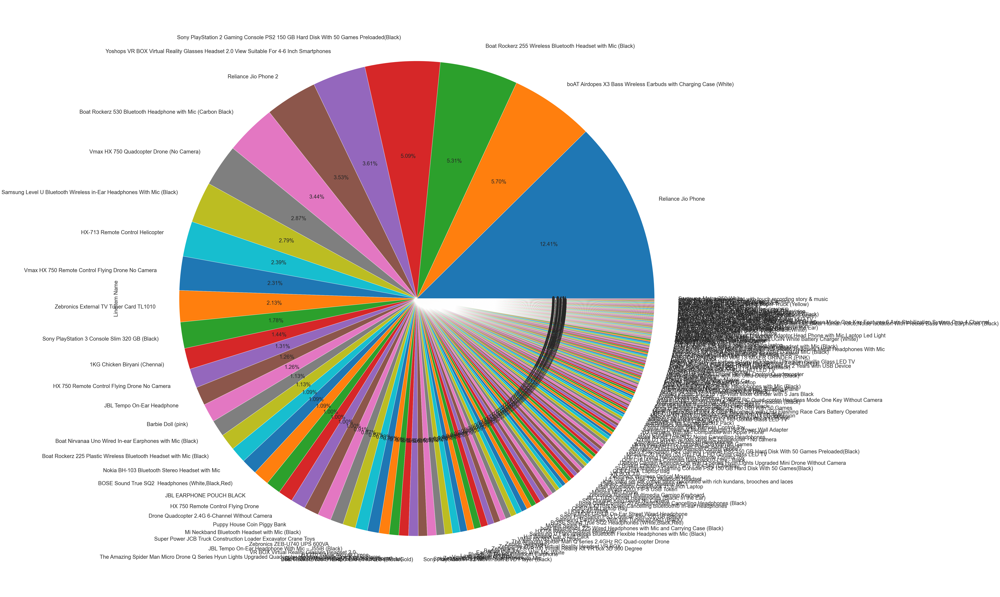

In [27]:
f=df2['LineItem Name'].value_counts().plot(kind='pie',figsize = (50,50),autopct = '%0.2f%%', fontsize = 25)
f

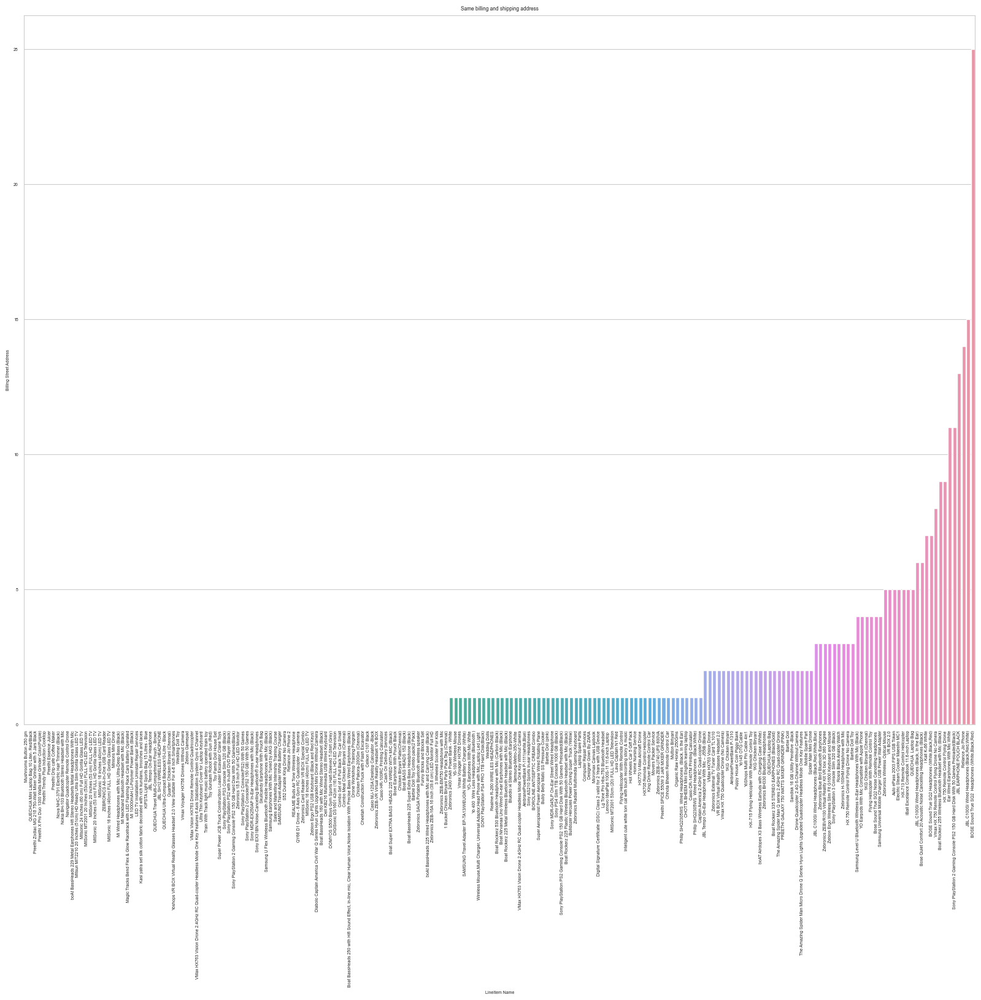

In [53]:
f = df2.groupby('LineItem Name').count().sort_values('Billing Street Address').reset_index()
plt.gcf()
sns.barplot(data= f, x= 'LineItem Name', y='Billing Street Address')
plt.title('Same billing and shipping address')
matplotlib.rcParams['font.size'] = 5
matplotlib.rcParams['figure.figsize'] = (20,50)
matplotlib.rcParams['figure.subplot.wspace']
plt.xticks(rotation = 90)
plt.show()


Unexpected International Orderes

In [55]:
df3 = data[(data['Shipping Street Address']!='IND')]

In [116]:
df3

,Order #,Order Date and Time Stamp,Fulfillment Status,Payment Status,Payment Date and Time Stamp,Fulfillment Date and Time Stamp,Currency,Subtotal,Shipping Method,Shipping Cost,...,Payment Method,Tracking #,Special Instructions,LineItem Name,LineItem SKU,LineItem Options,LineItem Add-ons,LineItem Qty,LineItem Sale Price,LineItem Type
0,R929392577,09-11-2020 20:36:26 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,799.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN,NaN,1,799.0,physical
1,R653462960,09-11-2020 20:18:26 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,699.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Samsung U Flex Wireless Bluetooth Flexible Hea...,PL000032123,NaN,NaN,1,699.0,physical
2,R226302759,09-11-2020 19:56:21 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,799.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Boat Rockerz 530 Bluetooth Headphone with Mic ...,NaN,NaN,NaN,1,799.0,physical
3,R390235057,09-11-2020 19:37:40 +0530,Unfulfilled,Unpaid,NaN,NaN,INR,599.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,JBL Tempo On-Ear Headphone,PL000157,NaN,NaN,1,599.0,physical
4,R813855117,09-11-2020 18:35:47 +0530,Cancelled,Paid,NaN,NaN,INR,699.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Mi Neckband Bluetooth Headset with Mic (Black),PL000041332,NaN,NaN,1,699.0,physical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2292,R243395005,05-10-2016 04:17:45 +0530,Cancelled,Unpaid,NaN,NaN,INR,50.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Ear Wired Earphones With Mic White,11,NaN,NaN,1,50.0,physical
2293,R607209508,03-10-2016 15:10:47 +0530,Cancelled,Unpaid,NaN,NaN,INR,500.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,I Kall K-66 White,9,NaN,NaN,1,500.0,physical
2294,R140316623,29-09-2016 18:33:27 +0530,Cancelled,Unpaid,NaN,NaN,INR,4000.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Electric Steam Cooker Maestro MC1,1,NaN,NaN,2,2000.0,physical
2295,R192037084,28-09-2016 18:59:22 +0530,Cancelled,Unpaid,NaN,NaN,INR,2000.0,Ships Free,₹ 0.00,...,NaN,NaN,NaN,Electric Steam Cooker Maestro MC1,1,NaN,NaN,1,2000.0,physical


In [130]:
df3['LineItem Name'].value_counts().plot(kind = 'pie', figsize=(100,100))

<AxesSubplot:ylabel='LineItem Name'>

In [73]:
xc = df3['LineItem Name'].value_counts().sort_values(ascending=False).reset_index()
xc



,index,LineItem Name
0,Reliance Jio Phone,285
1,boAT Airdopes X3 Bass Wireless Earbuds with Ch...,131
2,Boat Rockerz 255 Wireless Bluetooth Headset wi...,122
3,Sony PlayStation 2 Gaming Console PS2 150 GB H...,117
4,Yoshops VR BOX Virtual Reality Glasses Headset...,83
...,...,...
201,Nova NHC-3791 Electric Hair Trimmer (Black),1
202,Combo Meal Chicken Biriyani (Chennai),1
203,"Boat BassHeads 250 with Hifi Sound Effect, in-...",1
204,Zebronics ZEB-16A 16 inch (39.6 cm) LED Monito...,1


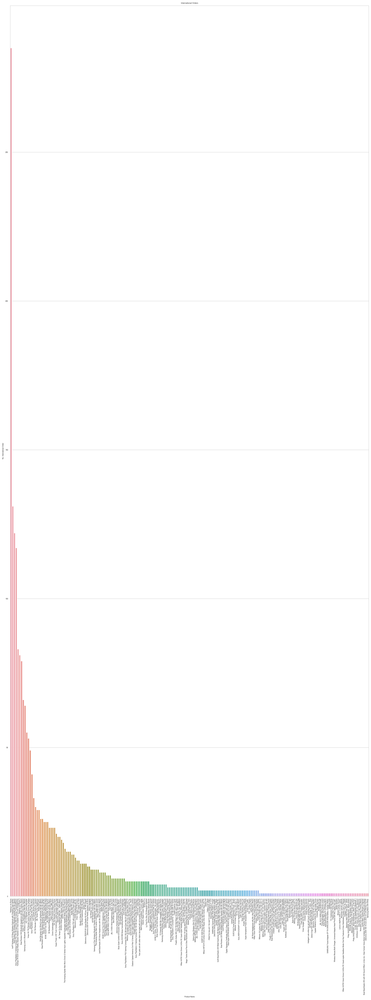

In [77]:
plt.gcf()
sns.barplot(data= xc,y='LineItem Name', x='index')
plt.title('International Orders')
plt.ylabel('No. International Order')
plt.xlabel('Product Name')
matplotlib.rcParams['font.size'] = 5
matplotlib.rcParams['figure.figsize'] = (20,30)
matplotlib.rcParams['figure.dpi']= 120
plt.xticks(rotation = 90)
plt.show()

Text(0.5, 1.0, 'no. of International orders')

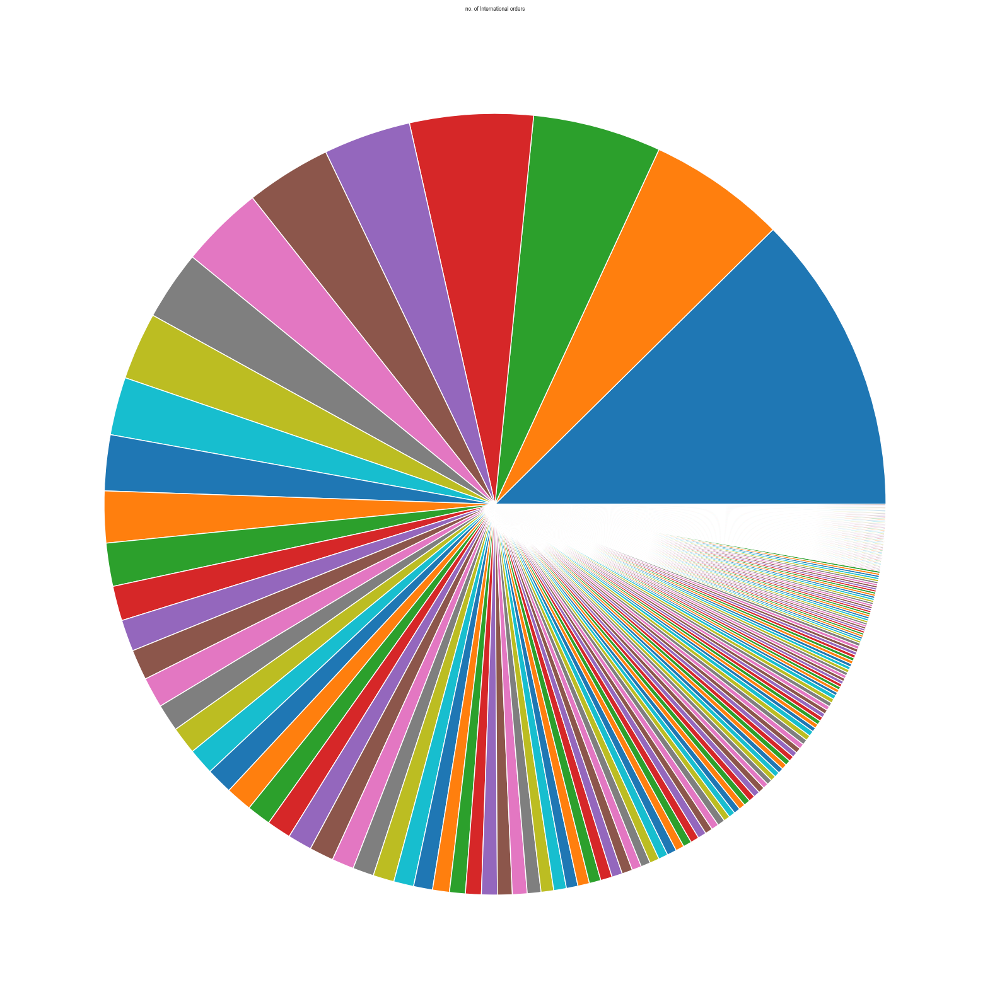

In [64]:
plt.gcf()
plt.pie(xc)
plt.title('no. of International orders')

In [131]:
import xlsxwriter
import openpyxl

In [133]:
with pd.ExcelWriter('Report3.xlsx') as wr:
    data[['Shipping Street Address','Shipping Street Address 2','Billing Street Address','Billing Street Address 2']].to_excel(wr, sheet_name= 'Data')
    data1[['Order #','LineItem Name']].to_excel(wr, sheet_name= 'Data with 0null')
    a.to_excel(wr, sheet_name='acc to itemName')
    b.to_excel(wr,sheet_name='Multi order of same add')
    df.to_excel(wr, sheet_name='acc to itemName')
    df_new.to_excel(wr,sheet_name='price>10000')
    c.to_excel(wr,sheet_name='acc sale price')
    df2[(df2['Billing Street Address'] == df2['Shipping Street Address'])].to_excel(wr,sheet_name= 'Same add Dif mode')
    df3.to_excel(wr,sheet_name='Unusual International')